<img src="Cover_page.png">

# State wise Clustering based on a Few Industrial & Environment Features

### State wise Data

The data below shows the latest state-wise data published by the Ministry of Statistics and Programme Implementation (Environment Statistics-2024).


0,State_Area_km_sq,Energy_Requirement_MU,Energy_Supplied_MU,Energy_Not_Supplied_MU,Polluting_water_industries_total,Polluting_water_industries_Complying,Polluting_water_industries_Closed,Polluting_water_industries_Not_Complying,Plastic_Waste_Generation_TPA,Corp_exp_Agro_Fores_Sec_rs_lakh,Corp_exp_Conserv_Natur_Reso_Sec_rs_lakh,Corp_exp_Environ_Sust_Sec_rs_lakh,Corp_exp_total_3_sec_rs_lakh,Factories_indu,Workers_indu
State_UTs,,,,,,,,,,,,,,,
Andhra Pradesh,160229,72302,71892,409,3,2,1,0,39626,1,5841,4534,10376,16925,550303
Arunachal Pradesh,83743,915,891,23,2,2,0,0,3755,0,0,45,45,211,3247
Assam,78438,11464,11464,0,0,0,0,0,58765,0,20,4335,4355,5480,194795
Bihar,94163,39544,38761,783,84,50,34,0,74263,17,0,538,555,3289,110490
Chhattisgarh,135191,37445,37373,72,35,21,6,8,47450,5,0,1825,1829,4397,198792
Delhi,1483,35143,35133,10,3,3,0,0,345000,27,557,9787,10371,3007,63362
Goa,3702,4669,4669,0,0,0,0,0,29441,0,6,264,270,695,61839
Gujarat,196022,139042,138998,44,25,17,1,7,337693,555,1525,20567,22648,29766,1655897
Haryana,44212,61450,60944,505,661,602,40,19,185168,139,1641,6809,8589,11294,888115


## Visualization

### State wise Bar Chart for Features

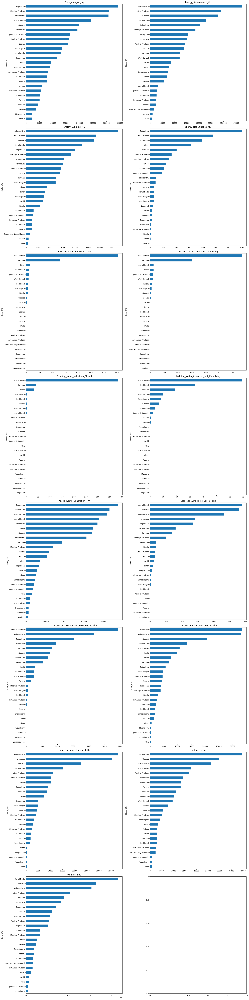

### Bivariate Visualization for All Features

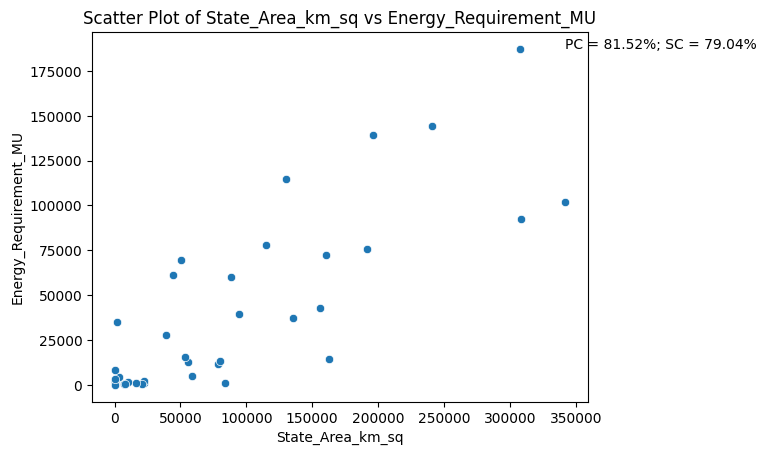

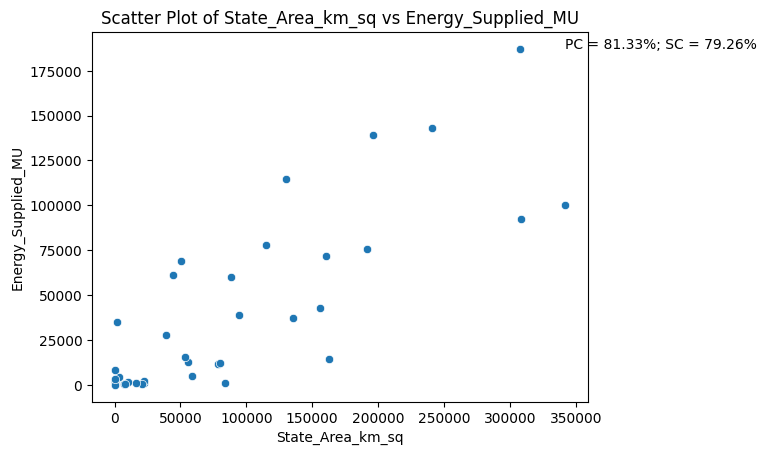

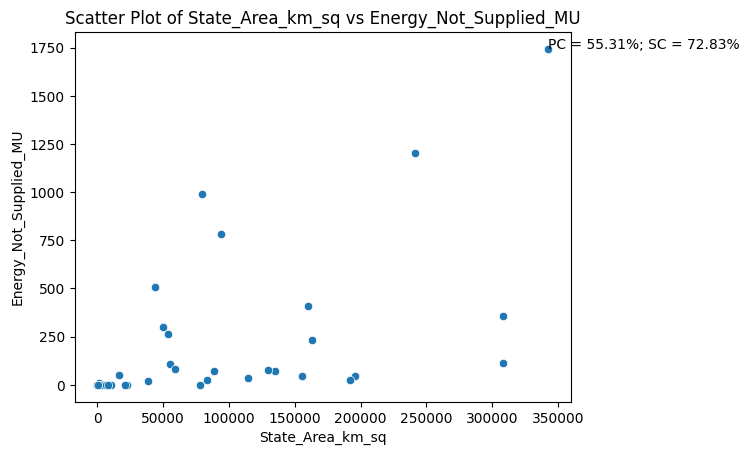

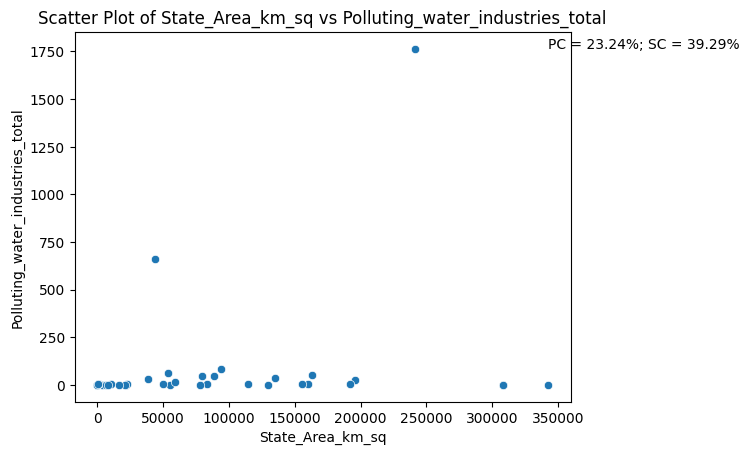

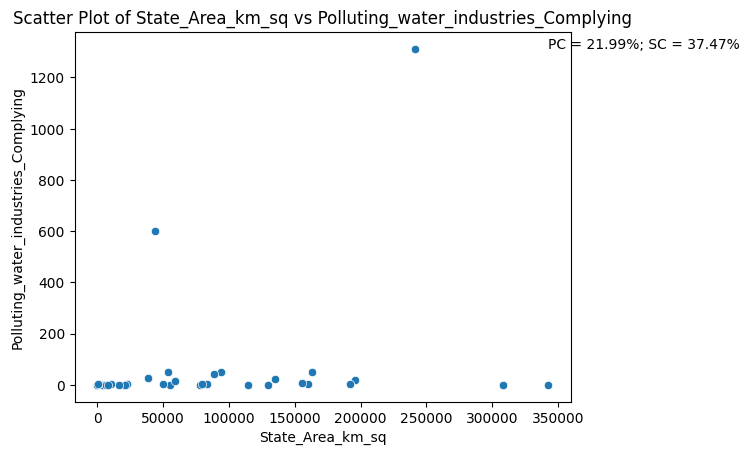

...

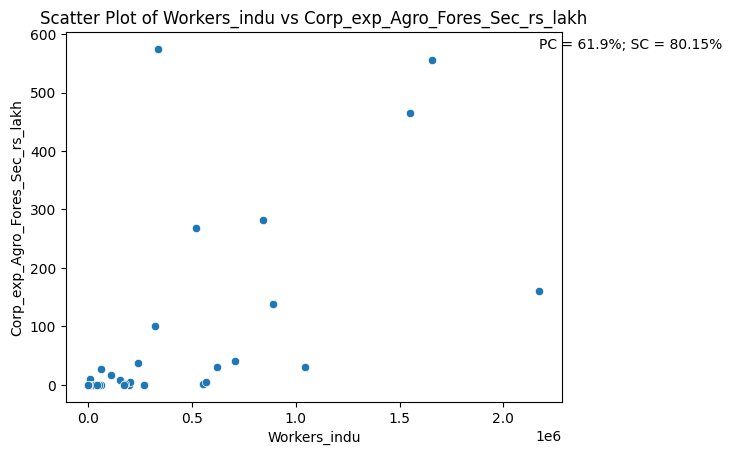

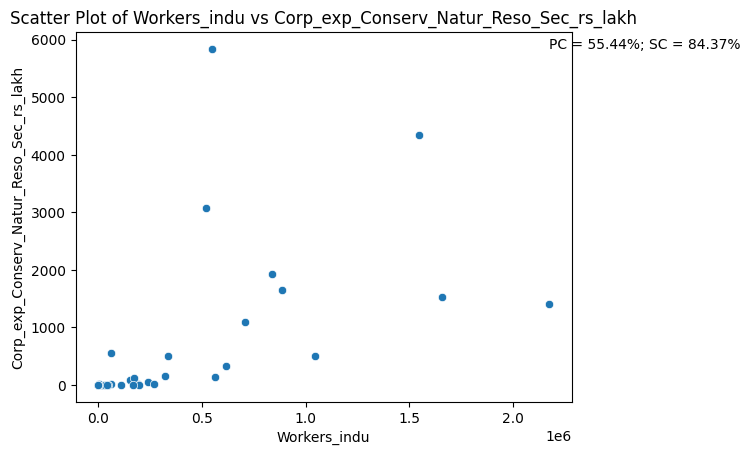

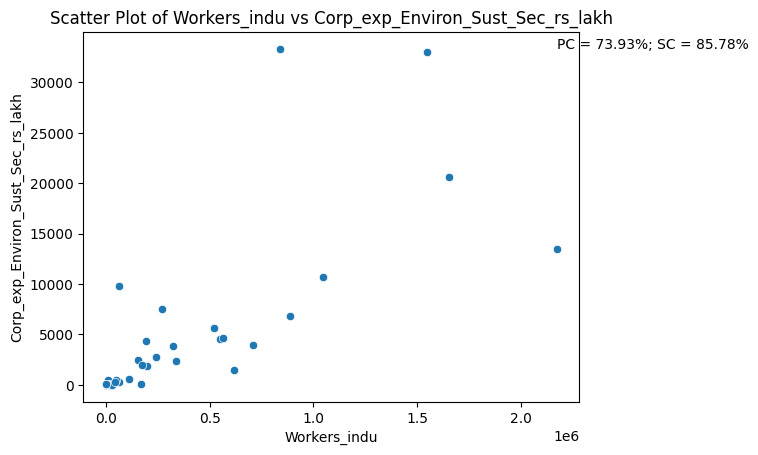

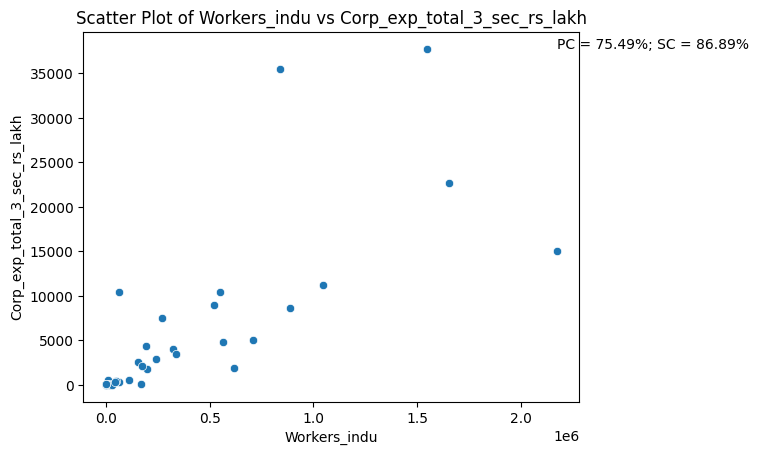

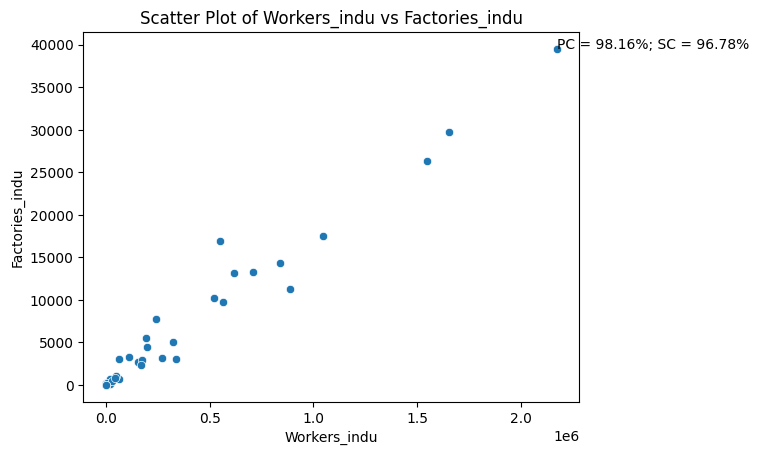

> - Most of the variables show non-linear relationships. (PC-> Pearson Correlation (Linear Relationship), SC -> Spearman Correlation (Linear & non-linear relationship)) </br>
> - A few variables show high variance (states are divided visually) while the others do not. 

### Outliers Detection

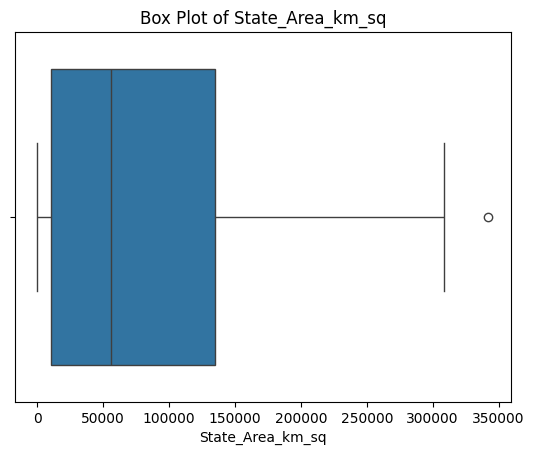

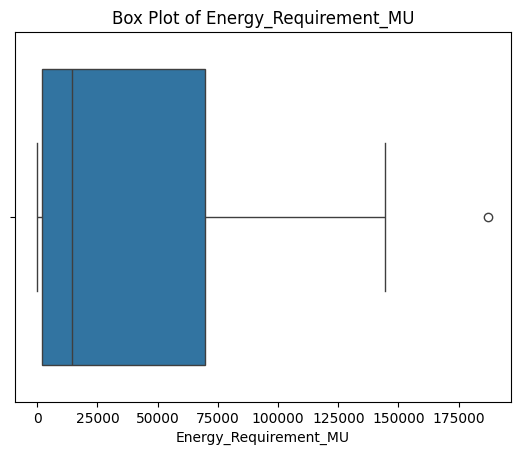

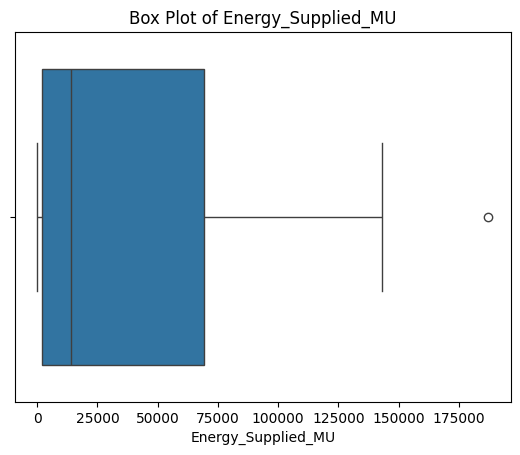

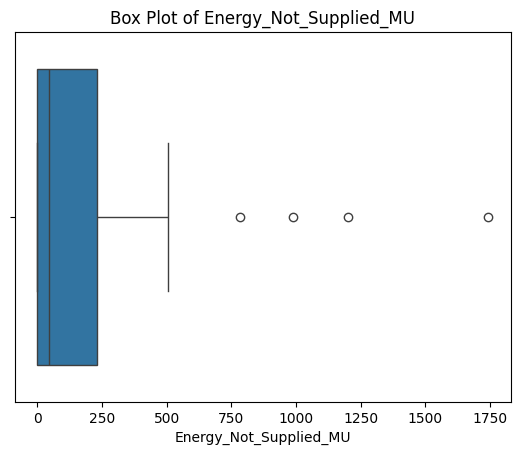

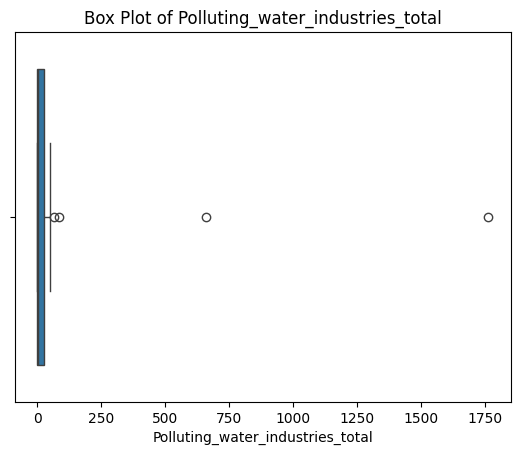

...

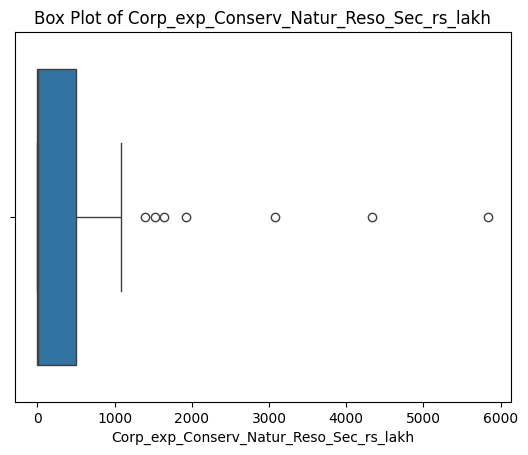

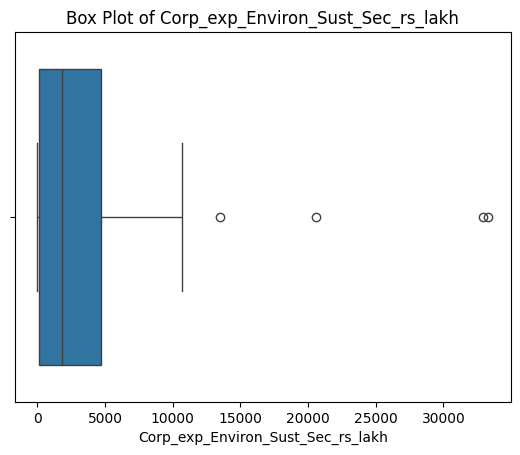

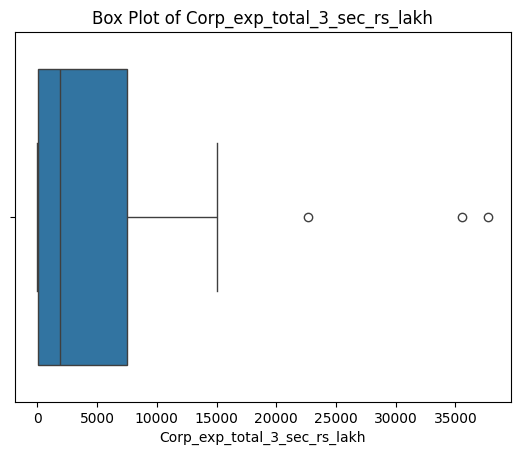

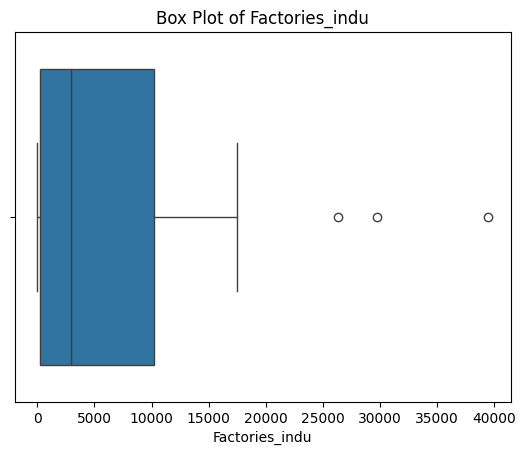

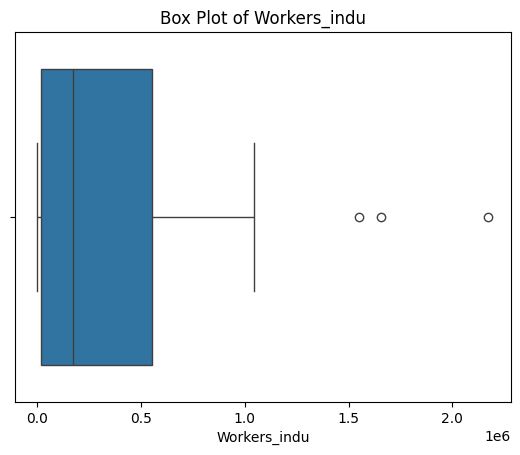

> All features are showing outliers (States performance). It would be better to use trimmed variance to select the features.

### Variable Selection for Clustering

0,Energy_Requirement_MU,State_Area_km_sq,Plastic_Waste_Generation_TPA,Workers_indu
State_UTs,,,,
Andhra Pradesh,72302,160229,39626,550303
Arunachal Pradesh,915,83743,3755,3247
Assam,11464,78438,58765,194795
Bihar,39544,94163,74263,110490
Chhattisgarh,37445,135191,47450,198792
Delhi,35143,1483,345000,63362
Goa,4669,3702,29441,61839
Gujarat,139042,196022,337693,1655897
Haryana,61450,44212,185168,888115


## Technical Part!

### No. of Clusters Selection and Final Model

> Considering both the inertia and silhoutte scores, 4 clusters (k=4) would be the best fit for this data.

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=4, random_state=42))])

Variable Selection through PC:



,PC1,PC2,PC3,PC4
Energy_Requirement_MU,0.079848,-0.046233,0.231252,0.968509
State_Area_km_sq,0.102409,-0.195107,0.944591,-0.243298
Plastic_Waste_Generation_TPA,0.199616,0.964154,0.174396,-0.012073
Workers_indu,0.971231,-0.173788,-0.154456,-0.051489


>**PC1 is an approximate for Industrial Workers.** </br>
>**PC2 is an approximate for Plastic Waste Generation.** </br>
>**PC3 is an approximate for State Area.** </br>

Cumulative % of total variance explained by PC:
                          PC1       PC2       PC3  PC4
Explained_variances  0.938345  0.978919  0.999377  1.0


>**PC1 and PC2 (principal componenets) explains 98% variation in the data**

### Compare Average Clusters

,Clusters,Energy_Requirement_MU,State_Area_km_sq,Plastic_Waste_Generation_TPA,Workers_indu,Energy_per_ind_worker,Plastic_waste_per_ind_worker,Plastic_waste_per_area,Energy_per_area,Workers_per_area,Plastic_waste_per_Energy
0,0,12571.750000,46136.166667,25683.250000,99421.833333,0.126449,0.258326,0.556684,0.272492,2.154965,2.042934
1,1,102758.750000,262910.250000,65770.000000,609359.250000,0.168634,0.107933,0.250161,0.390851,2.317746,0.640043
2,2,147049.333333,211264.333333,359684.666667,1792799.666667,0.082022,0.200627,1.702534,0.696044,8.486050,2.446014
3,3,54351.333333,82426.833333,360799.666667,566793.500000,0.095893,0.636563,4.377211,0.659389,6.876323,6.638285


***Comparing Clusters*** </br>
>1. **Cluster 0** - States under Cluster 0 exhibit the below properties, </br>
>   a. Low Energy Requirement, Small Geographic Area (in $Km^2$), Minimal Plastic Waste Generated and Few Industrial Workers as compared to states in other clusters.</br>
>   b. Energy per industrial worker and Plastic waste per Industrial worker are 2nd highest (Large) among states of other clusters.</br>
>   c. Lowest worker and Energy per area (in $Km^2$). </br></br>
> **So, Cluster 0 includes small states with the lowest worker & Energy per square KM and 2nd highest Plastic waste per Industrial Worker.** </br>

>2. **Cluster 1** - States under Cluster 1 exhibit the below properties, </br>
>   a. 2nd highest (Large level) Energy Requirement, Highest Geographical Area (in $Km^2$), Medium level of Plastic Waste Generated and Large level of Industrial Workers as compared to states in other clusters.</br>
>   b. Energy per industrial worker is highest which shows energy-intensive industries. Lowest Plastic waste per Industrial worker and plastic waste per area (in $Km^2$).</br>
>   c. Lowest Plastic waste per Energy required. </br></br>
> **So, Cluster 1 includes the highest states per area (in $Km^2$) with energy-intensive industries that generate the lowest plastic waste per worker, energy and area.** </br>

>3. **Cluster 2** - States under Cluster 2 exhibit the below properties, </br>
>   a. Highest level of Energy Requirement, 2nd Highest Geographical Area (in $Km^2$), 2nd highest Plastic Waste Generated and the highest level of Industrial Workers as compared to states in other clusters.</br>
>   b. Energy per industrial worker is the lowest. Medium level of Plastic waste per Industrial worker and 2nd highest level of plastic waste per area (in $Km^2$).</br>
>   c. Highest Worker and Energy per area. </br></br>
> **So, Cluster 2 includes the 2nd highest states per area (in $Km^2$) with the lowest energy per worker and highest energy and worker per area. Somewhat high plastic waste per worker, energy and area.** </br>

>4. **Cluster 3** - States under Cluster 3 exhibit the below properties, </br>
>   a. Medium level of Energy Requirement and Geographical Area (in $Km^2$), highest level of Plastic Waste Generated and medium level of Industrial Workers as compared to states in other clusters.</br>
>   b. Medium level of Energy per industrial worker.</br>
>   c. Highest level of Plastic waste per Industrial worker, per area (in $Km^2$) and per Energy. </br></br>
> **So, Cluster 3 includes states with high plastic waste, plastic waste per Industrial worker, per area (in $Km^2$) and per Energy.** </br>

<mark>**Note: Clusters are described in the Ordered ranking of - 1. Extra Large/Larger (Highest), 2. Large (2nd Highest), 3. Medium (2nd Lowest), and 4. Lowest**</mark>

**From the above analysis, We can rename the clusters as:** </br></br>
**1. Cluster 0 -> Small and less Resource States**</br>
**2. Cluster 1 -> Large and Efficient States**</br>
**3. Cluster 2 -> Large and Resourceful States**</br>
**4. Cluster 3 -> Medium and Inefficient States**</br>

### Plastic waste vs Industrial Workers

**Red Dots -> Cluster 0** -> Small and less Resource States -> Less Plastic waste and no. of Industrial Workers -> **23 States/UTs**</br>
**Blue Dots -> Cluster 1** -> Large and Efficient States -> Less Plastic Waste and considerably high no. of Industrial Workers -> **4 States/UTs**</br>
**Purple Dots -> Cluster 2** -> Large and Resourceful States -> Large amount of Plastic Waste with large no. of industrial workers -> **3 States/UTs**</br>
**Green Dots -> Cluster 3** -> Medium and Inefficient States -> Large amount of Plastic Waste with less no. of industrial workers -> **6 States/UTs**</br>

### Plastic Waste Generation VS State Area

**Red Dots -> Cluster 0** -> Small and less Resource States -> Less Plastic waste and small State Area (in $Km^2$) -> **23 States/UTs**</br>
**Blue Dots -> Cluster 1** -> Large and Efficient States -> Less Plastic Waste and Large State Area (in $Km^2$) -> **4 States/UTs**</br>
**Purple Dots -> Cluster 2** -> Large and Resourceful States -> Large amount of Plastic Waste with considerably large State Area (in $Km^2$) -> **3 States/UTs**</br>
**Green Dots -> Cluster 3** -> Medium and Inefficient States -> Large amount of Plastic Waste with small to medium State Area (in $Km^2$) -> **6 States/UTs**</br>

### Industrial Workers VS State Area

**Red Dots -> Cluster 0** -> Small and less Resource States -> Less No. of Industrial Workers and small to medium State Area (in $Km^2$) -> **23 States/UTs** </br>
**Blue Dots -> Cluster 1** -> Large and Efficient States -> Medium level of No. of Industrial Workers and Large State Area (in $Km^2$) -> **4 States/UTs** </br>
**Purple Dots -> Cluster 2** -> Large and Resourceful States -> Large No. of Industrial Workers with considerably large State Area (in $Km^2$) -> **3 States/UTs**</br>
**Green Dots -> Cluster 3** -> Medium and Inefficient States -> Small to Medium level of No. of Industrial Workers with small to medium State Area (in $Km^2$) -> **6 States/UTs**</br>

**The below Image is showing the India States/UTs by Clusters created above.**

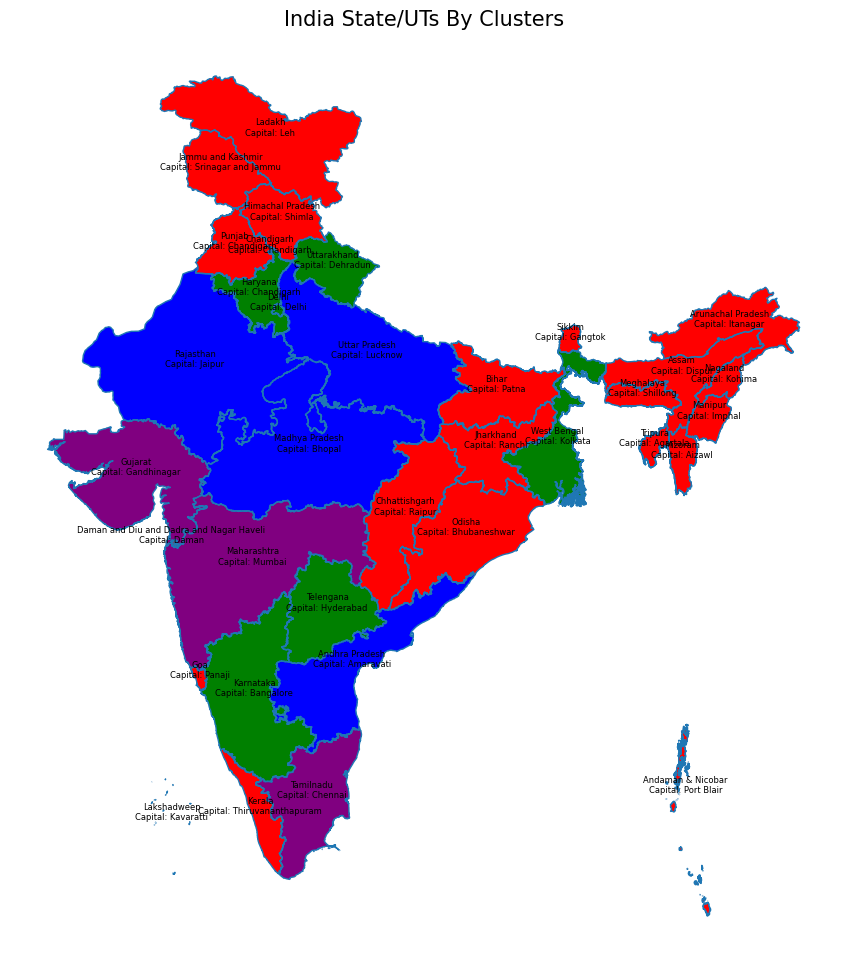

## Final Thoughts: How Each Stakeholder Can Use the Cluster Analysis

**1. Governments and policy makers:** By analyzing clusters of states with similar characteristics (such as population size, area, or resource availability), the government can compare successful policies from efficient states (like those with well-managed waste systems) to states with similar features but poor performance. This allows for data-driven policy crafting, ensuring that less efficient states can adopt best practices from their more efficient peers.

**2. Manufacturers and industries:** For companies seeking to expand or optimize production, they can use the clustering insights to identify high-potential regions. For instance, if Cluster 1 and Cluster 2 contain states in the mid and western parts of India with abundant resources, efficient operations, and a large industrial workforce, industries can target these regions for setting up new facilities. This ensures access to the right workforce, resources, and compliance with sustainability standards, driving both economic and environmental benefits.

**3. Environmental groups:** Environmental organizations can identify clusters with high plastic waste generation or other environmental concerns and focus their efforts there. These groups can collaborate with local governments to reduce waste or promote recycling efforts, leveraging data from similar states that have improved their environmental performance.

**4. Policy analysts:** Policy analysts can use cluster data to evaluate the effectiveness of initiatives in states that have transitioned from inefficient to efficient clusters. By comparing similar states within and between clusters, analysts can identify what specific policies or changes were impactful and recommend scaling those initiatives.